C:\Users\a\AppData\Local\Temp\ipykernel_28768\1562706720.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd




==================== Mean ====================


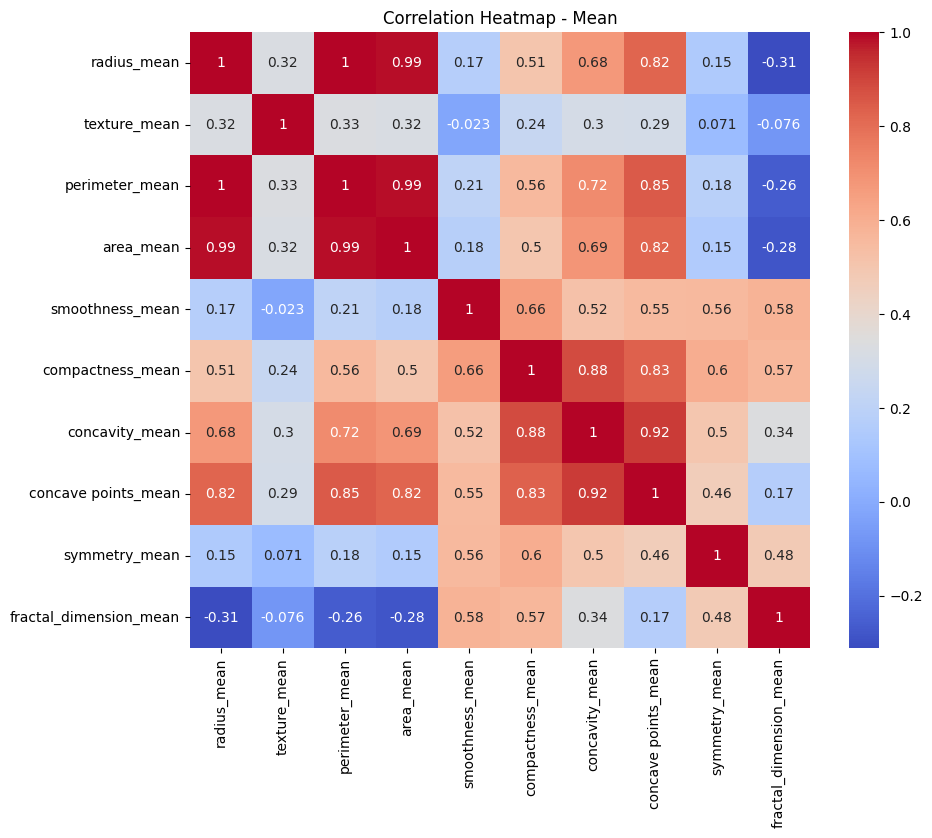

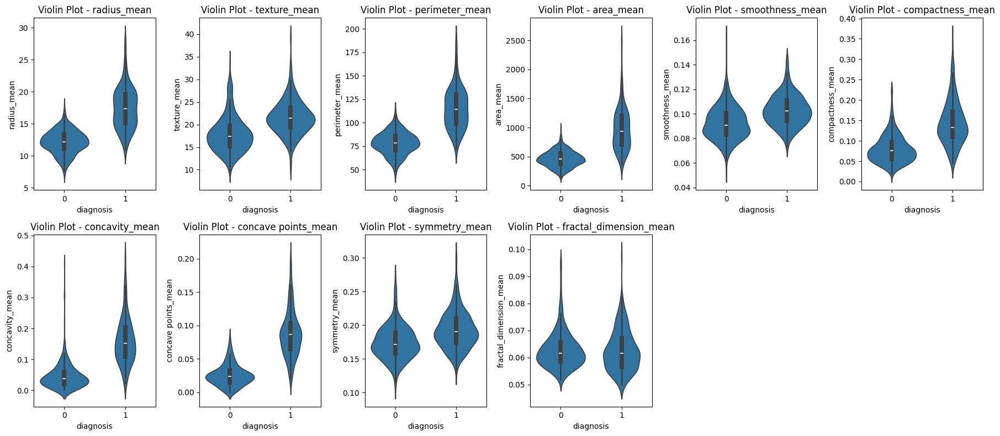

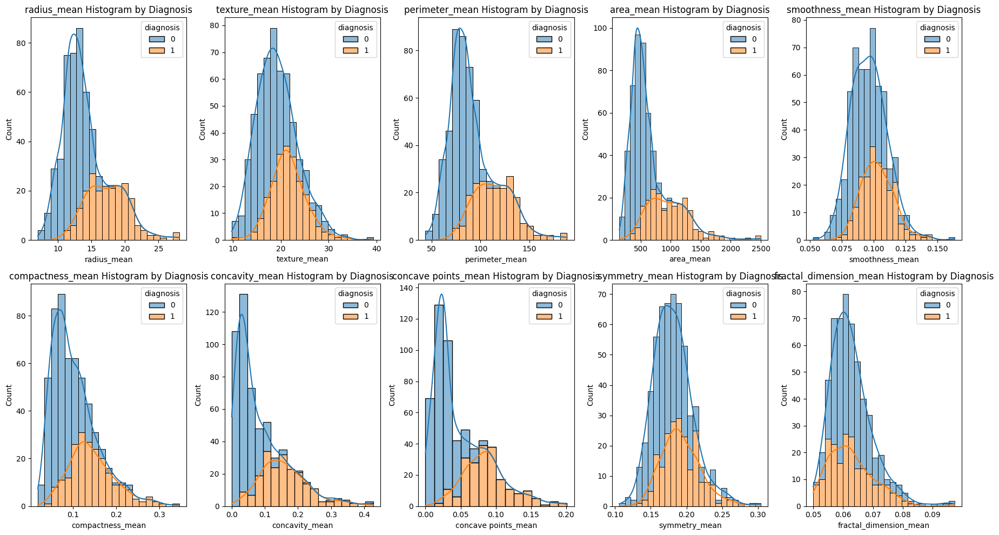

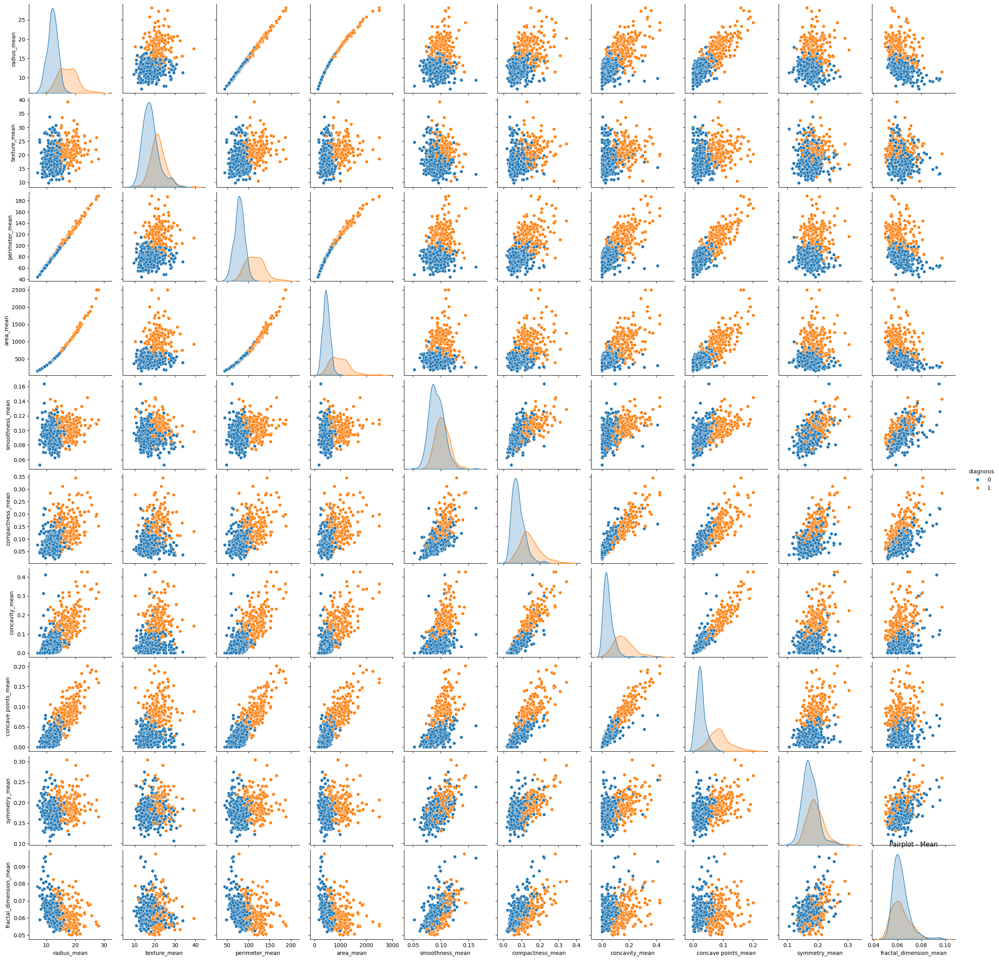

Statistics when diagnosis is 1:
                              mean         std
radius_mean              17.462830    3.203971
texture_mean             21.604906    3.779470
perimeter_mean          115.365377   21.854653
area_mean               978.376415  367.937978
smoothness_mean           0.102898    0.012608
compactness_mean          0.145188    0.053987
concavity_mean            0.160775    0.075019
concave points_mean       0.087990    0.034374
symmetry_mean             0.192909    0.027638
fractal_dimension_mean    0.062680    0.007573

Statistics when diagnosis is 0:
                              mean         std
radius_mean              12.146524    1.780512
texture_mean             17.914762    3.995125
perimeter_mean           78.075406   11.807438
area_mean               462.790196  134.287118
smoothness_mean           0.092478    0.013446
compactness_mean          0.080085    0.033750
concavity_mean            0.046058    0.043442
concave points_mean       0.025717    0.01

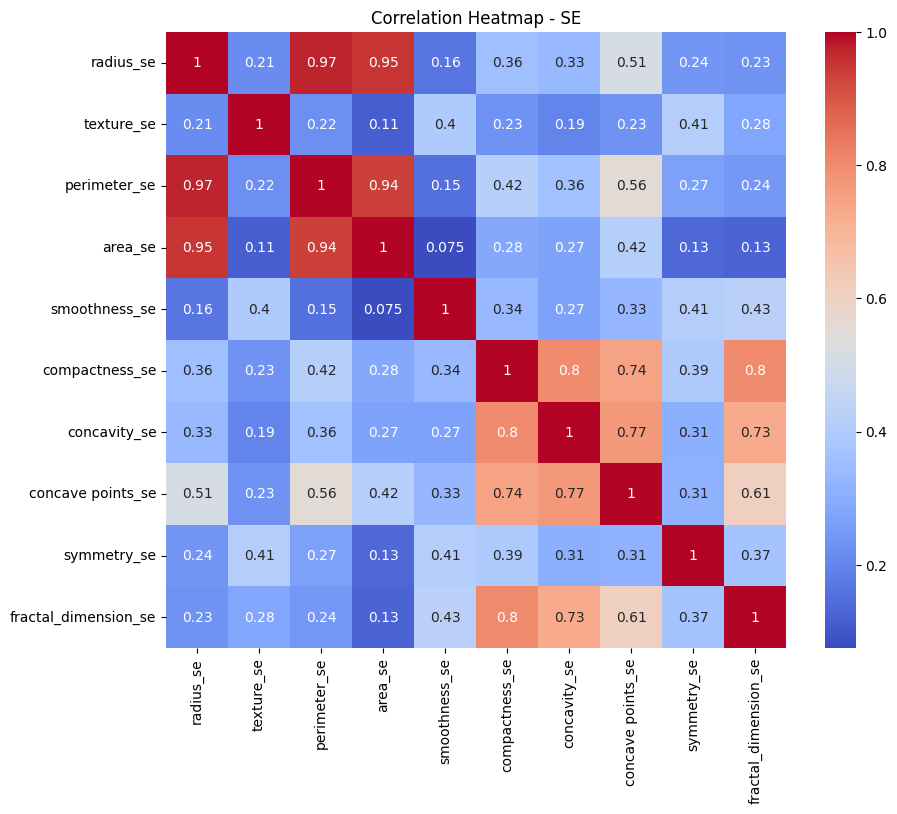

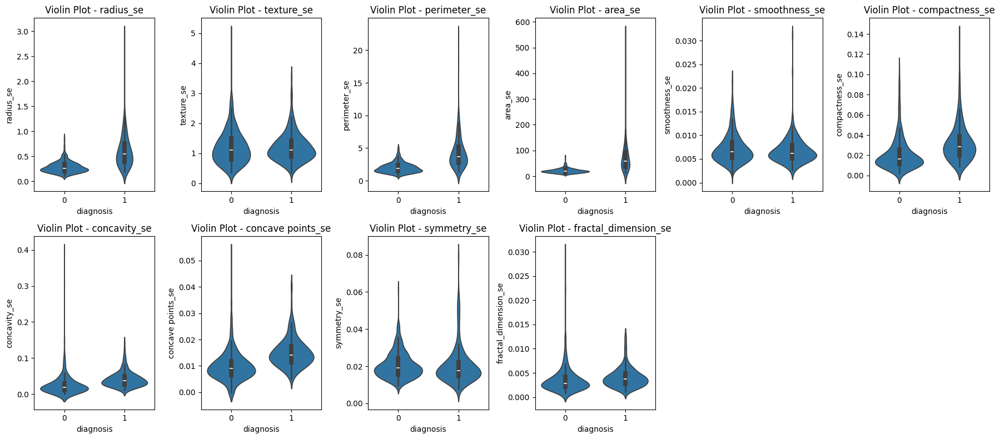

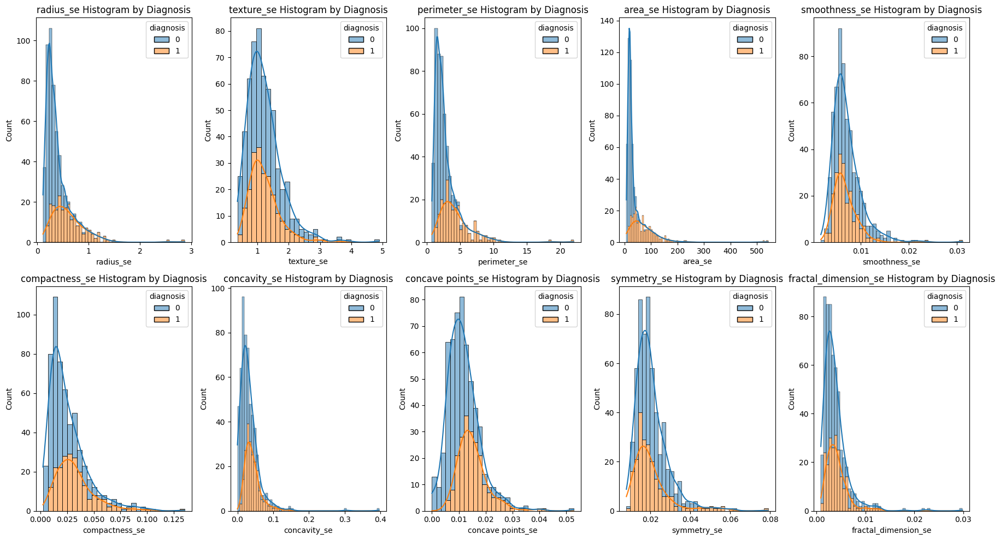

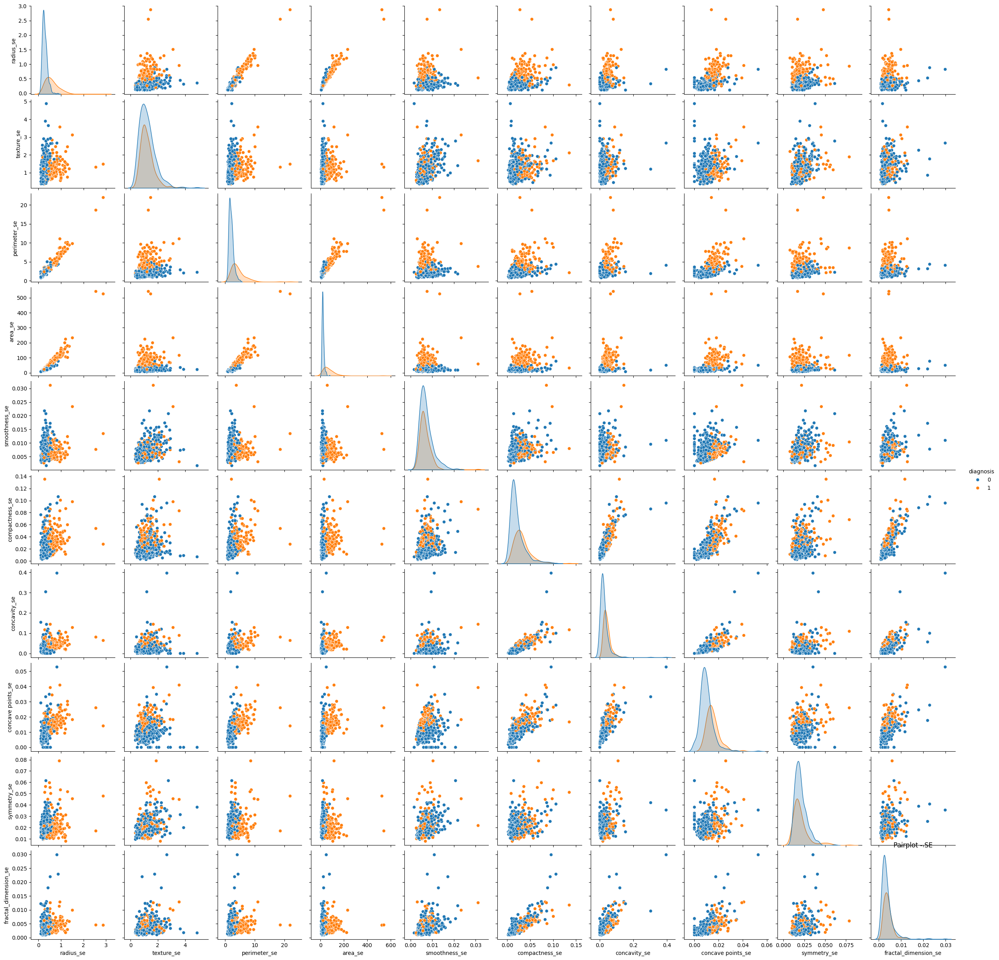

Statistics when diagnosis is 1:
                           mean        std
radius_se              0.609083   0.345039
texture_se             1.210915   0.483178
perimeter_se           4.323929   2.568546
area_se               72.672406  61.355268
smoothness_se          0.006780   0.002890
compactness_se         0.032281   0.018387
concavity_se           0.041824   0.021603
concave points_se      0.015060   0.005517
symmetry_se            0.020472   0.010065
fractal_dimension_se   0.004062   0.002041

Statistics when diagnosis is 0:
                           mean       std
radius_se              0.284082  0.112570
texture_se             1.220380  0.589180
perimeter_se           2.000321  0.771169
area_se               21.135148  8.843472
smoothness_se          0.007196  0.003061
compactness_se         0.021438  0.016352
concavity_se           0.025997  0.032918
concave points_se      0.009858  0.005709
symmetry_se            0.020584  0.006999
fractal_dimension_se   0.003636  0.002938


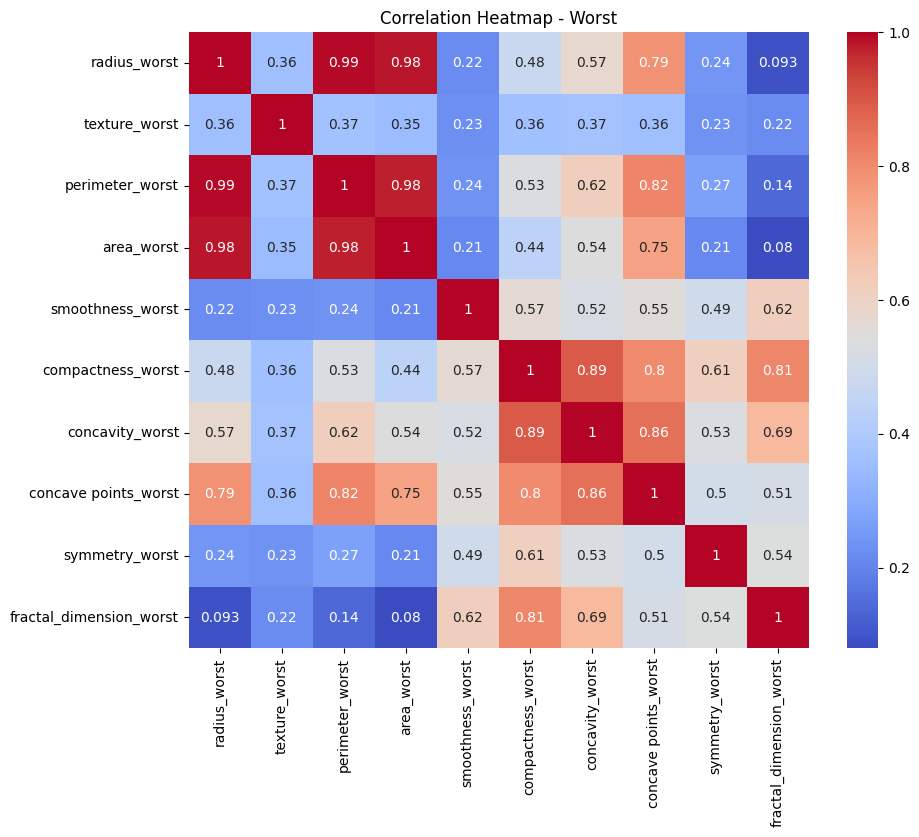

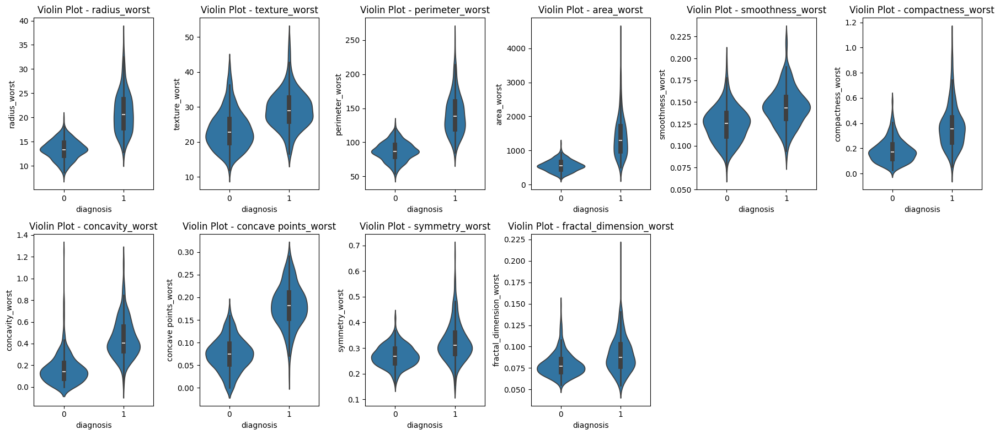

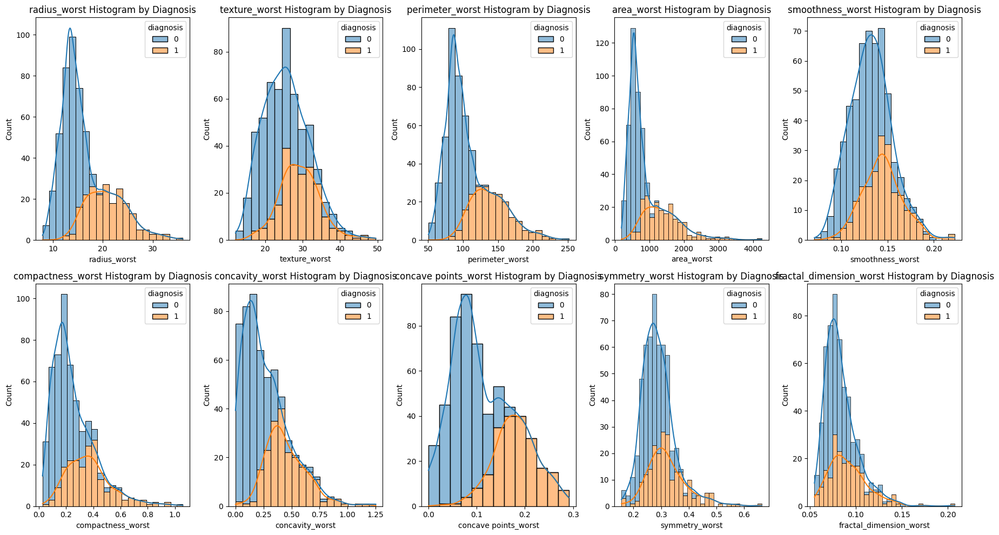

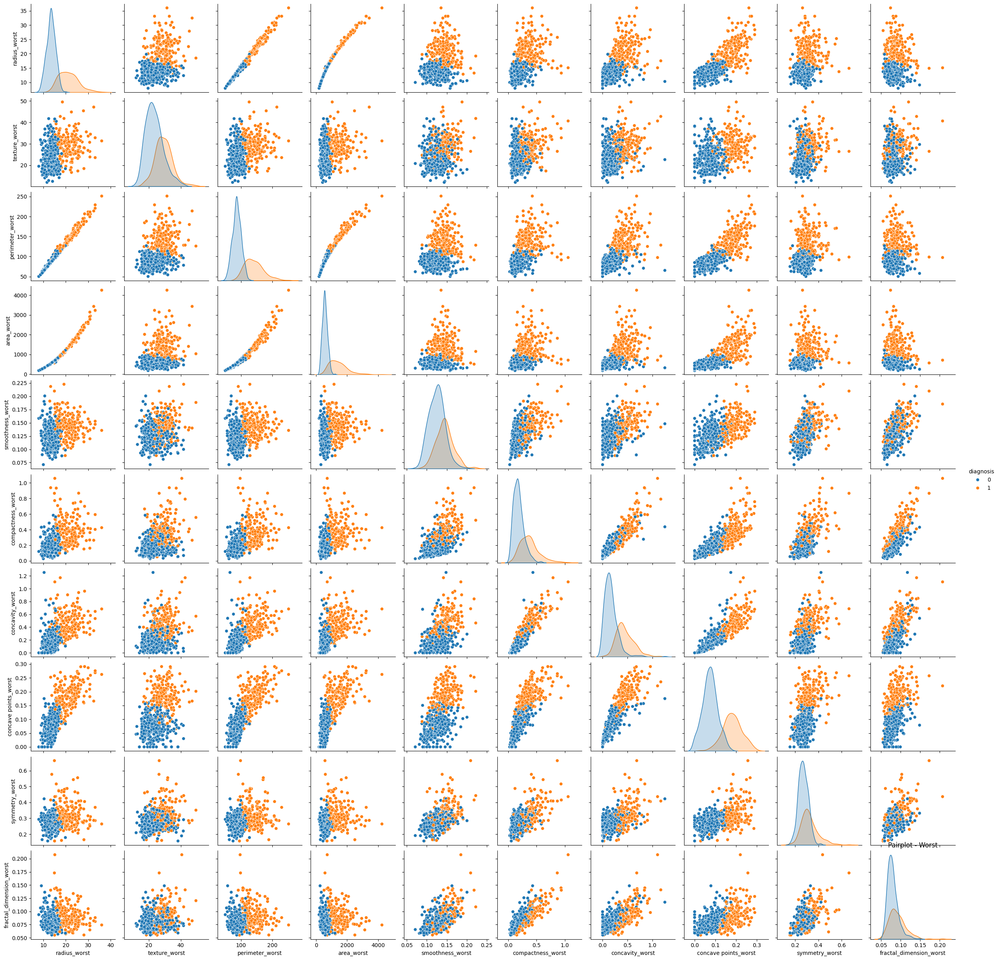

Statistics when diagnosis is 1:
                                mean         std
radius_worst               21.134811    4.283569
texture_worst              29.318208    5.434804
perimeter_worst           141.370330   29.457055
area_worst               1422.286321  597.967743
smoothness_worst            0.144845    0.021870
compactness_worst           0.374824    0.170372
concavity_worst             0.450606    0.181507
concave points_worst        0.182237    0.046308
symmetry_worst              0.323468    0.074685
fractal_dimension_worst     0.091530    0.021553

Statistics when diagnosis is 0:
                               mean         std
radius_worst              13.379801    1.981368
texture_worst             23.515070    5.493955
perimeter_worst           87.005938   13.527091
area_worst               558.899440  163.601424
smoothness_worst           0.124959    0.020013
compactness_worst          0.182673    0.092180
concavity_worst            0.166238    0.140368
concave poin

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("data.csv")

mean_cols = [col for col in df.columns if 'mean' in col]
se_cols = [col for col in df.columns if 'se' in col]
worst_cols = [col for col in df.columns if 'worst' in col]

groups = {'Mean': mean_cols, 'SE': se_cols, 'Worst': worst_cols}

for group_name, group_cols in groups.items():
    print(f"\n\n{'='*20} {group_name} {'='*20}")

    plt.figure(figsize=(10, 8))
    sns.heatmap(df[group_cols].corr(), annot=True, cmap='coolwarm')
    plt.title(f"Correlation Heatmap - {group_name}")
    plt.show()

    plt.figure(figsize=(18, 8))
    for i, col in enumerate(group_cols, start=1):
        plt.subplot(2, len(group_cols)//2 + 1, i)
        sns.violinplot(x='diagnosis', y=col, data=df)
        plt.title(f"Violin Plot - {col}")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(18, 10))
    for i, var in enumerate(group_cols):
        plt.subplot(2, len(group_cols)//2, i+1)
        sns.histplot(df, x=var, hue='diagnosis', kde=True, multiple='stack')
        plt.title(f"{var} Histogram by Diagnosis")
    plt.tight_layout()
    plt.show()

    sns.pairplot(df[group_cols + ['diagnosis']], hue='diagnosis')
    plt.title(f"Pairplot - {group_name}")
    plt.show()

    print("Statistics when diagnosis is 1:")
    group_stats_1 = df[df['diagnosis'] == 1][group_cols].agg(['mean', 'std']).transpose()
    print(group_stats_1)

    print("\nStatistics when diagnosis is 0:")
    group_stats_0 = df[df['diagnosis'] == 0][group_cols].agg(['mean', 'std']).transpose()
    print(group_stats_0)